# データセットの作成

In [14]:
! conda install tensorflow -y 

Solving environment: failed with initial frozen solve. Retrying with flexible solve.
Solving environment: failed with repodata from current_repodata.json, will retry with next repodata source.
Solving environment: done

## Package Plan ##

  environment location: /opt/conda

  added / updated specs:
    - tensorflow


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    _tflow_select-2.3.0        |            eigen           3 KB
    absl-py-0.15.0             |     pyhd3eb1b0_0         103 KB
    aiohttp-3.8.1              |   py37h7f8727e_0         511 KB
    aiosignal-1.2.0            |     pyhd3eb1b0_0          12 KB
    astor-0.8.1                |   py37h06a4308_0          47 KB
    astunparse-1.6.3           |             py_0          17 KB
    async-timeout-4.0.1        |     pyhd3eb1b0_0          10 KB
    asynctest-0.13.0           |             py_0          26 KB
    blinker-1.4 

In [15]:
import tensorflow as tf

In [16]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar100.load_data()


In [9]:
!mkdir data

In [12]:
import numpy as np
np.save('data/train_data', x_train)
np.save('data/train_labels', y_train)

np.save('data/eval_data', x_test)
np.save('data/eval_labels', y_test)

In [9]:
import boto3

region = "ap-northeast-1"

bucket_name = "sagemaker-datasets-sample-hogefuga"

s3_client = boto3.client('s3',region_name = region)
location = {'LocationConstraint' : region}
s3_client.create_bucket(Bucket = bucket_name , CreateBucketConfiguration = location)

{'ResponseMetadata': {'RequestId': 'S0GZJSXP9TQSV69K',
  'HostId': 'X245QSg7Jn8ybA11QRvC7blnoW3twEqhD9nDpWnSb5zsz6UKTbywpRxe++BM9iBbAhKdBgcs8wU=',
  'HTTPStatusCode': 200,
  'HTTPHeaders': {'x-amz-id-2': 'X245QSg7Jn8ybA11QRvC7blnoW3twEqhD9nDpWnSb5zsz6UKTbywpRxe++BM9iBbAhKdBgcs8wU=',
   'x-amz-request-id': 'S0GZJSXP9TQSV69K',
   'date': 'Thu, 17 Feb 2022 11:59:35 GMT',
   'location': 'http://sagemaker-datasets-sample-morchika.s3.amazonaws.com/',
   'server': 'AmazonS3',
   'content-length': '0'},
  'RetryAttempts': 0},
 'Location': 'http://sagemaker-datasets-sample-morchika.s3.amazonaws.com/'}

In [13]:
import glob
for filepath in glob.glob("./data/*.npy"):
    s3_client.upload_file(filepath, bucket_name, filepath.replace("./data/", ""))


# モデルの定義・学習

In [50]:
import os
import sagemaker
from sagemaker import get_execution_role

sagemaker_session = sagemaker.Session()

role = get_execution_role()
region = sagemaker_session.boto_session.region_name

In [55]:
training_data_uri = "s3://{}/".format(bucket_name)


In [56]:
metric_definitions = [
        {"Name": "loss", "Regex": "loss: ([0-9\\.]+)"},
        {"Name": "accuracy", "Regex": "accuracy: ([0-9\\.]+)"},
        {"Name": "val_loss", "Regex": "val_loss: ([0-9\\.]+)"},
        {"Name": "val_accuracy", "Regex": "val_accuracy: ([0-9\\.]+)"},
    ]

In [68]:
from sagemaker.tensorflow import TensorFlow
cifar_estimator = TensorFlow(
    entry_point="main.py",
    role=role,
    instance_count=2,
    instance_type="ml.p3.2xlarge",
    framework_version="2.1.0",
    py_version="py3",
    metric_definitions=metric_definitions,
    enable_sagemaker_metrics=True,
    distribution={"parameter_server": {"enabled": True}},
    tags=[{"Key": "trial-desc", "Value": trial_desc}],
)

In [69]:
cifar_estimator.fit(
    training_data_uri
)

INFO:sagemaker.image_uris:Defaulting to the only supported framework/algorithm version: latest.
INFO:sagemaker.image_uris:Ignoring unnecessary instance type: None.
INFO:sagemaker:Amazon SageMaker Debugger does not currently support Parameter Server distribution
INFO:sagemaker:Creating training-job with name: tensorflow-training-2022-02-17-17-15-16-357


2022-02-17 17:15:17 Starting - Starting the training job...
2022-02-17 17:15:19 Starting - Launching requested ML instancesProfilerReport-1645118116: InProgress
.........
2022-02-17 17:17:09 Starting - Preparing the instances for training......
2022-02-17 17:18:10 Downloading - Downloading input data
2022-02-17 17:18:10 Training - Downloading the training image.........
2022-02-17 17:19:42 Training - Training image download completed. Training in progress..2022-02-17 17:19:45,481 sagemaker-containers INFO     Imported framework sagemaker_tensorflow_container.training
2022-02-17 17:19:45,776 sagemaker_tensorflow_container.training INFO     Running distributed training job with parameter servers
2022-02-17 17:19:45,776 sagemaker_tensorflow_container.training INFO     Launching parameter server process
2022-02-17 17:19:45,776 sagemaker_tensorflow_container.training INFO     Running distributed training job with parameter servers
2022-02-17 17:19:46,700 sagemaker_tensorflow_container.train

# モデルのデプロイ

In [71]:
predictor = cifar_estimator.deploy(initial_instance_count=1, instance_type="ml.p2.xlarge")
predictor.endpoint_name

See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.
INFO:sagemaker:Creating model with name: tensorflow-training-2022-02-17-17-45-17-907
INFO:sagemaker:Creating endpoint with name tensorflow-training-2022-02-17-17-45-17-907


-------!

'tensorflow-training-2022-02-17-17-45-17-907'

# Studio での検証

In [123]:
CIFAR100_LABELS_LIST = [
                        'apple', 'aquarium_fish', 'baby', 'bear', 'beaver', 'bed', 'bee', 'beetle',
                        'bicycle', 'bottle', 'bowl', 'boy', 'bridge', 'bus', 'butterfly', 'camel',
                        'can', 'castle', 'caterpillar', 'cattle', 'chair', 'chimpanzee', 'clock',
                        'cloud', 'cockroach', 'couch', 'crab', 'crocodile', 'cup', 'dinosaur',
                        'dolphin', 'elephant', 'flatfish', 'forest', 'fox', 'girl', 'hamster',
                        'house', 'kangaroo', 'keyboard', 'lamp', 'lawn_mower', 'leopard', 'lion',
                        'lizard', 'lobster', 'man', 'maple_tree', 'motorcycle', 'mountain', 'mouse',
                        'mushroom', 'oak_tree', 'orange', 'orchid', 'otter', 'palm_tree', 'pear',
                        'pickup_truck', 'pine_tree', 'plain', 'plate', 'poppy', 'porcupine',
                        'possum', 'rabbit', 'raccoon', 'ray', 'road', 'rocket', 'rose',
                        'sea', 'seal', 'shark', 'shrew', 'skunk', 'skyscraper', 'snail', 'snake',
                        'spider', 'squirrel', 'streetcar', 'sunflower', 'sweet_pepper', 'table',
                        'tank', 'telephone', 'television', 'tiger', 'tractor', 'train', 'trout',
                        'tulip', 'turtle', 'wardrobe', 'whale', 'willow_tree', 'wolf', 'woman',
                        'worm'
                        ]


In [100]:
predictions = predictor.predict(x_test[0:3])
print("予測された値:{}".format(CIFAR100_LABELS_LIST[np.argmax(predictions["predictions"][0])]) , 
          "正解の値:{}".format(CIFAR100_LABELS_LIST[y_test[0][0]]))
print("予測された値:{}".format(CIFAR100_LABELS_LIST[np.argmax(predictions["predictions"][1])]) , 
          "正解の値:{}".format(CIFAR100_LABELS_LIST[y_test[1][0]]))
print("予測された値:{}".format(CIFAR100_LABELS_LIST[np.argmax(predictions["predictions"][2])]) , 
          "正解の値:{}".format(CIFAR100_LABELS_LIST[y_test[2][0]]))

予測された値:road 正解の値:mountain
予測された値:forest 正解の値:forest
予測された値:seal 正解の値:seal


# ローカルでの検証

In [129]:
! pip install pillow -y
import json
import numpy as np
import boto3
import io
from PIL import Image
import IPython.display as display

runtime = boto3.Session().client(service_name='sagemaker-runtime')
file_name = "apple.jpg"
endpoint = 'tensorflow-training-2022-02-17-17-45-17-907'

def predict(file_name):
    # Load the image bytes
    f = open(file_name, 'rb').read()
    f = io.BytesIO(f)
    image_view = Image.open(f).convert('RGB')
    batch_size = 1
    image = np.asarray(image_view.resize((32, 32)))
    image = np.concatenate([image[np.newaxis, :, :]] * batch_size)
    body = json.dumps({"signature_name": "serving_default", "instances": image.tolist()})

    # Call your model for predicting which object appears in this image.
    response = runtime.invoke_endpoint(
        EndpointName=endpoint,
        ContentType='application/json', 
        Body=body
    )
    result = response['Body'].read()
    pred = json.loads(result)['predictions'][0]
    index = np.argmax(pred)
    display.display( image_view.resize((128, 128)) ) 
    print("{}%で{}です".format(int(pred[index]*100), CIFAR100_LABELS_LIST[index]))


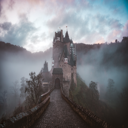

97%でmountainです


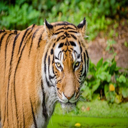

99%でtigerです


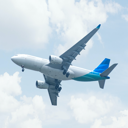

59%でlizardです


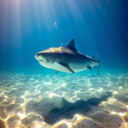

46%でsharkです


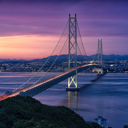

99%でseaです


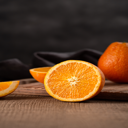

99%でorangeです


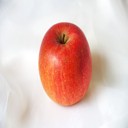

70%でappleです


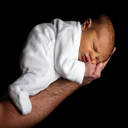

65%でmouseです


In [130]:
import glob
for file_name in glob.glob("./sample/*"):
    predict(file_name)

# 必ずエンドポイントの削除

In [131]:
predictor.delete_endpoint()

INFO:sagemaker:Deleting endpoint configuration with name: tensorflow-training-2022-02-17-17-45-17-907
INFO:sagemaker:Deleting endpoint with name: tensorflow-training-2022-02-17-17-45-17-907
